<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;"> Library import & Dataset </div>

In [1]:
import warnings
warnings.filterwarnings('ignore')  

In [2]:
import numpy as np  
import pandas as pd  
import matplotlib.pyplot as plt  
import seaborn as sns  

In [3]:
DF  = pd.read_csv('WCM_Correlations.csv')

In [4]:
DF.keys()

Index(['CR_SMAP_WCM', 'CR_SMAP_WCM_RMSE', 'CR_GLDAS_WCM', 'CR_GLDAS_WCM_RMSE',
       'CR_SMAP_GLDAS', 'CR_SMAP_GLDAS_RMSE', 'CR_SMAP_CYGNSS', 'RMS_SMAP_SM',
       'RMS_LAI_NOAA', 'WCM_ORG_SMAP_CR', 'WCM_ORG_SMAP_RMSE', 'Lat', 'Lon',
       'Lat_Lon', 'CR_SMAP_CYGNSS_RMSE', 'XGBoost_CR_SMAP',
       'XGBoost_RMSE_SMAP'],
      dtype='object')

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Applying Model on 238 pixels</p>

## XGBoost Regression Model

In [5]:
import XGB_Regressor
import imp
imp.reload(XGB_Regressor)
import XGB_Regressor as SCL2

lat = [22.18,22.54,22.9,23.26,23.62,23.98,24.34,24.7,25.06,25.42,25.78,26.14,26.5,26.86] 
lon = [73.18,73.54,73.9,74.26,74.98,75.34,75.7,76.06,76.42,76.78,77.14,77.5,77.86,78.22,78.58,78.94]
Lat  = []
Lon  = []
CR   = []
RMSE = []
for i in range(len(lat)):
    for j in range(len(lon)):
        CR2, RMSE2 = SCL2.Saving_Correlations_XGBoost(lat[i],lon[j])
        Lat.append(lat[i])
        Lon.append(lon[i])
        CR.append(CR2)
        RMSE.append(RMSE2)
        
DF['XGBoost_RMSE_SMAP'] = RMSE
DF['XGBoost_CR_SMAP']   = CR

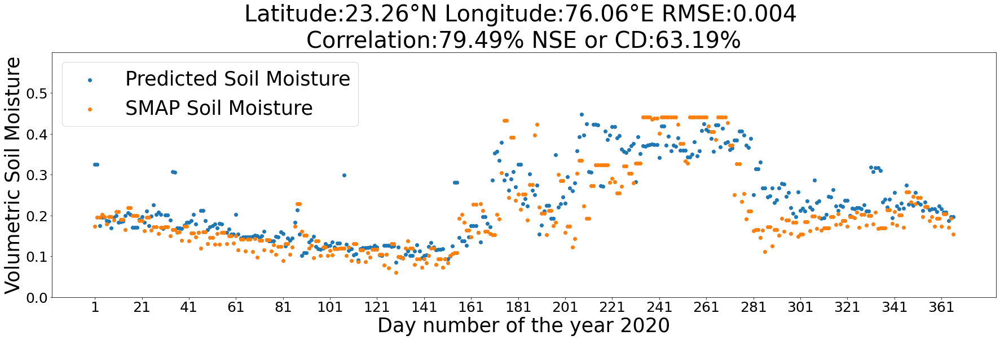

<Figure size 576x576 with 0 Axes>

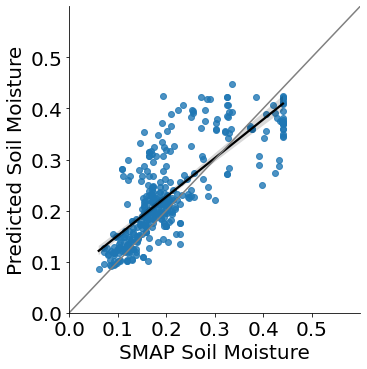

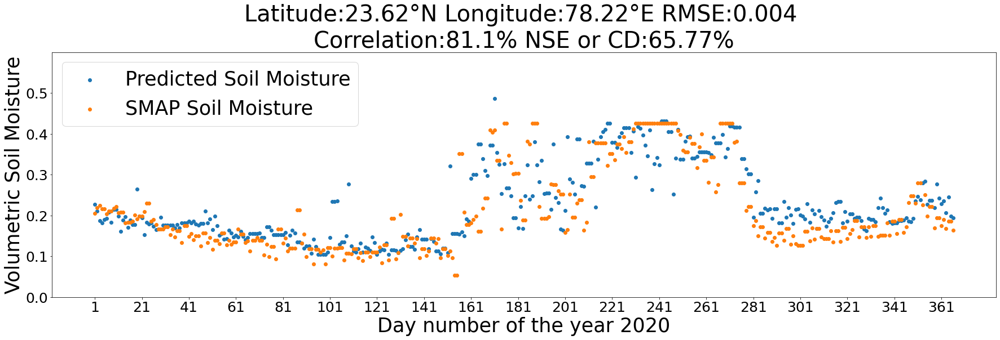

<Figure size 576x576 with 0 Axes>

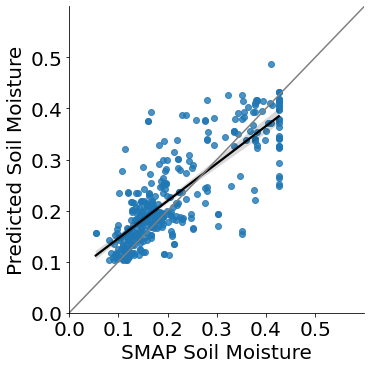

In [6]:
SCL2.Plotting_Comparision1(23.26,76.06)
SCL2.Plotting_Comparision1(23.62,78.22)

## Light GBM Regression Model

In [7]:
import LGBM
import imp
imp.reload(LGBM)
import LGBM as SCL1

lat = [22.18,22.54,22.9,23.26,23.62,23.98,24.34,24.7,25.06,25.42,25.78,26.14,26.5,26.86] 
lon = [73.18,73.54,73.9,74.26,74.98,75.34,75.7,76.06,76.42,76.78,77.14,77.5,77.86,78.22,78.58,78.94]
Lat  = []
Lon  = []
CR   = []
RMSE = []
for i in range(len(lat)):
    for j in range(len(lon)):
        CR1, RMSE1 = SCL1.Saving_Correlations_LGBoost(lat[i],lon[j])
        Lat.append(lat[i])
        Lon.append(lon[i])
        CR.append(CR1)
        RMSE.append(RMSE1)
        
DF['LGB_SMAP_RMSE'] = RMSE
DF['LGB_SMAP_CR'] = CR

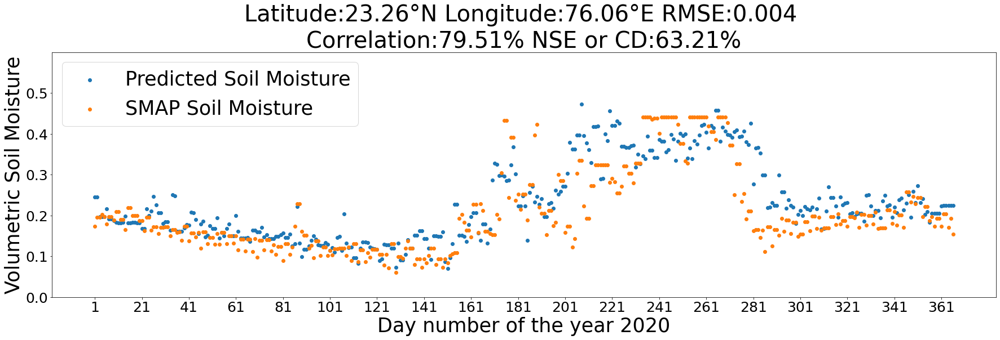

<Figure size 576x576 with 0 Axes>

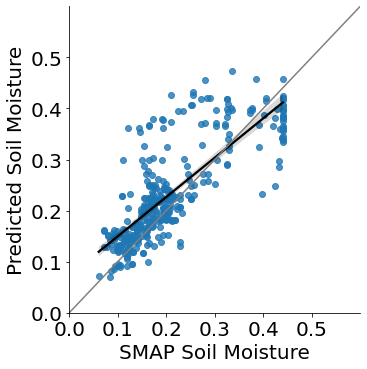

In [8]:
SCL1.Plotting_Comparision1(23.26,76.06)

## CatBoost Regression Model

In [51]:
import Cat_Boost
import imp
imp.reload(Cat_Boost)
import Cat_Boost as SCL

lat = [22.18,22.54,22.9,23.26,23.62,23.98,24.34,24.7,25.06,25.42,25.78,26.14,26.5,26.86] 
lon = [73.18,73.54,73.9,74.26,74.98,75.34,75.7,76.06,76.42,76.78,77.14,77.5,77.86,78.22,78.58,78.94]
Lat  = []
Lon  = []
CR   = []
RMSE = []
for i in range(len(lat)):
    for j in range(len(lon)):
        CR1, RMSE1 = SCL.Saving_Correlations_LGBoost(lat[i],lon[j])
        Lat.append(lat[i])
        Lon.append(lon[i])
        CR.append(CR1)
        RMSE.append(RMSE1)
        
DF['CATB_SMAP_RMSE'] = RMSE
DF['CATB_SMAP_CR'] = CR

<Figure size 2160x576 with 0 Axes>

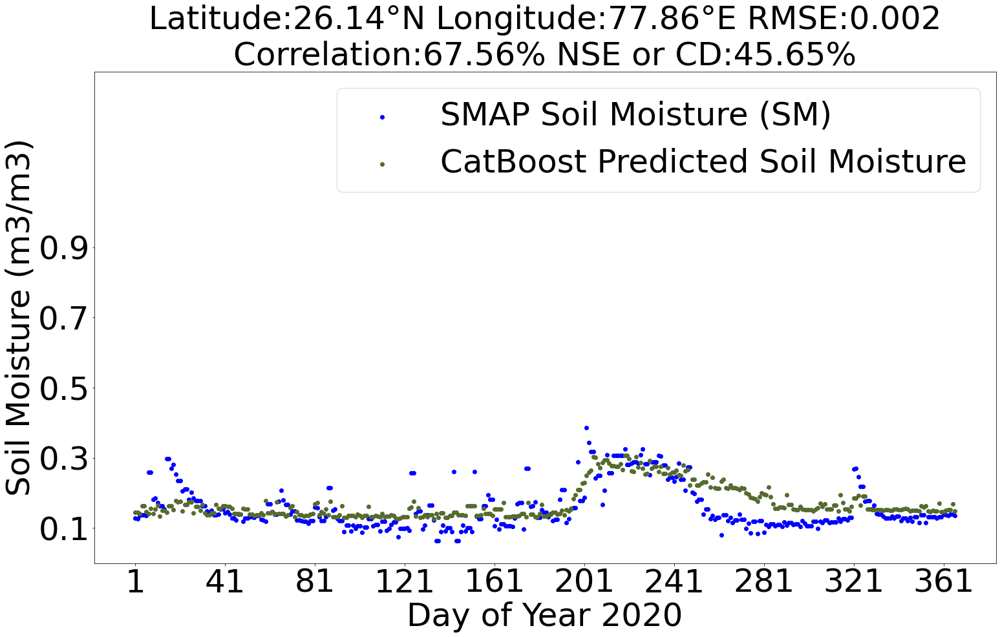

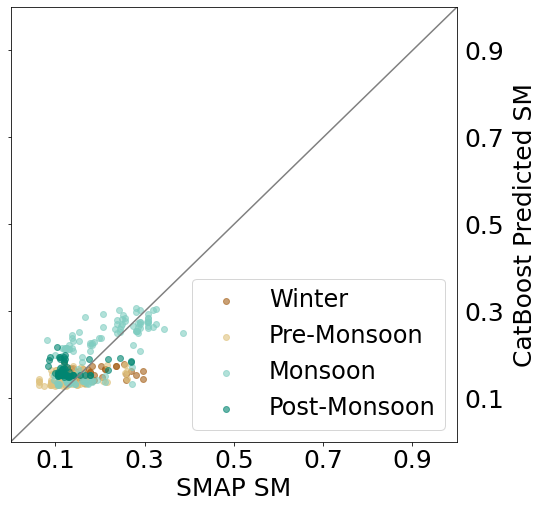

In [53]:
SCL.Plotting_Comparision1(26.14,77.86)

<Figure size 2160x576 with 0 Axes>

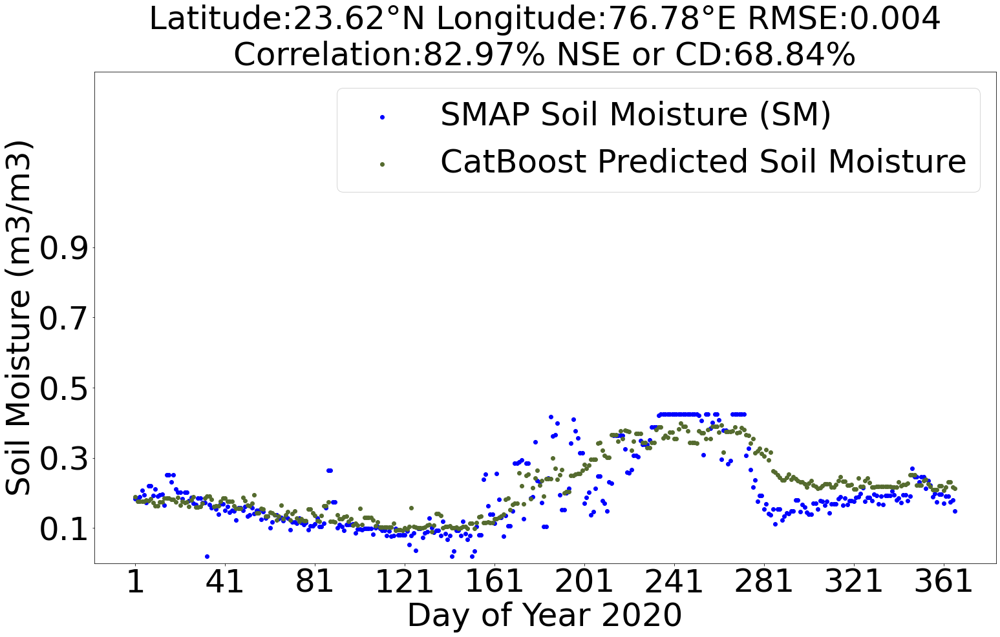

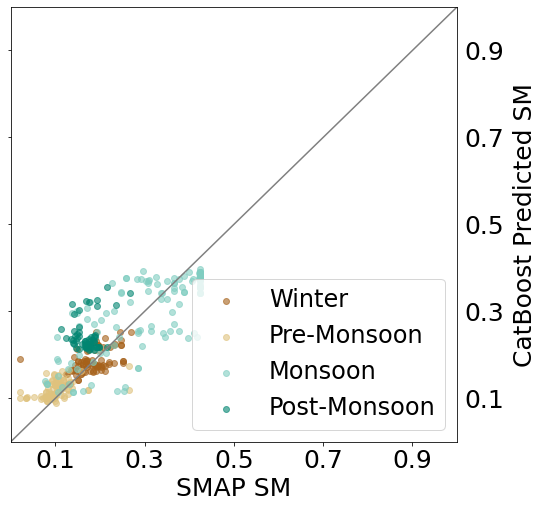

In [54]:
SCL.Plotting_Comparision1(23.62,76.78)

## Relative Errors of Soil Moisture

In [11]:
lat = [22.18,22.54,22.9,23.26,23.62,23.98,24.34,24.7,25.06,25.42,25.78,26.14,26.5,26.86] 
lon = [73.18,73.54,73.9,74.26,74.98,75.34,75.7,76.06,76.42,76.78,77.14,77.5,77.86,78.22,78.58,78.94]
DF['LGB_SMAP_RMSE/RMS_SMAP']     = (DF['LGB_SMAP_RMSE']/DF['RMS_SMAP_SM'])**2
DF['CATB_SMAP_RMSE/RMS_SMAP']    = (DF['CATB_SMAP_RMSE']/DF['RMS_SMAP_SM'])**2
DF['XGBOOST_SMAP_RMSE/RMS_SMAP'] = (DF['XGBoost_RMSE_SMAP']/DF['RMS_SMAP_SM'])**2

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Resampling using Kriging </p> 

In [12]:
import skgstat as skg
from skgstat import Variogram
from skgstat import OrdinaryKriging

## Interpolated all the metrices in a 3 Km grid cell

+ With a Variogram, we will basically try to find and describe some systematic statistical behavior from these similarities. 
+ The process of grouping distance data together is called binning.

+ The OrdinaryKriging class need at least a fitted Variogram instance. + Using min_points we can demand the Kriging equation system to be build upon at least 5 points to yield robust results. 
+ If not enough close observations are found within the effective range of the variogram, the estimation will not be calculated and a np.NaN value is estimated.
+ The max_points parameter will set the upper bound of the equation system by using in this case at last the 20 nearest points. 
+ Adding more will most likely not change the estimation, as more points will recieve small, if not negligible, weights. 
+ But it will increase the processing time, as each added point will increase the Kriging equation system dimensionality by one.
+ The mode parameter sets the method that will build up the equation system. 
+ There are two implemented: mode=’exact’ and mode=’estimate’. 

In [13]:
lon1,lat1 = np.meshgrid(lon,lat)

In [14]:
keys1 = ['XGBoost_CR_SMAP','LGB_SMAP_CR','CATB_SMAP_CR']
keys2 = ['LGB_SMAP_RMSE','LGB_SMAP_RMSE/RMS_SMAP',
         'CATB_SMAP_RMSE/RMS_SMAP','CATB_SMAP_RMSE',
        'XGBOOST_SMAP_RMSE/RMS_SMAP','XGBoost_RMSE_SMAP']

In [15]:
def Interpolating_Krigging(data):
  xx, yy = np.mgrid[22.18:27.6:0.36, 73.18:79.6:0.36]
  DFf = pd.DataFrame(xx.flatten())
  DFf.columns = ['Lat']
  DFf['Lon']  = yy.flatten()

  Keys = ['XGBoost_CR_SMAP','XGBoost_RMSE_SMAP','XGBOOST_SMAP_RMSE/RMS_SMAP',
          'LGB_SMAP_CR','CATB_SMAP_CR','LGB_SMAP_RMSE','LGB_SMAP_RMSE/RMS_SMAP',
          'CATB_SMAP_RMSE/RMS_SMAP','CATB_SMAP_RMSE']
  for K in Keys:
    V  = Variogram(data[['Lat', 'Lon']].values, data[f'{K}'].values,maxlag=5, n_lags=25, model='gaussian',normalize=False)
    ok = OrdinaryKriging(V, min_points=1, max_points=3, mode='exact')
    field = ok.transform(xx.flatten(), yy.flatten()).reshape(xx.shape)
    DFf[f'{K}'] = field.flatten()
  return DFf

In [16]:
%%time
DFf = Interpolating_Krigging(DF)

Wall time: 3.01 s


<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Performances in the Catchment </p> 

In [17]:
Keys = ['XGBoost_CR_SMAP','XGBoost_RMSE_SMAP','XGBOOST_SMAP_RMSE/RMS_SMAP',
          'LGB_SMAP_CR','CATB_SMAP_CR','LGB_SMAP_RMSE','LGB_SMAP_RMSE/RMS_SMAP',
          'CATB_SMAP_RMSE/RMS_SMAP','CATB_SMAP_RMSE']

In [18]:
%%time
for K in Keys:
  DDM  = DFf[f'{K}']
  DDM1 = DF[f'{K}']
  for i in range(len(DDM)):
    DDM2 = DDM[i]
    if DDM2>max(DDM1) or DDM2<min(DDM1):
      DDM[i] = np.nan
    else:
      DDM[i] = DDM[i]
  DFf[f'{K}'] = DDM

Wall time: 757 ms


In [19]:
Listed  = ['XGB_CD_SMAP','LGB_CD_SMAP','CATB_SMAP_CD']
Listed2 = ['XGBoost_CR_SMAP','LGB_SMAP_CR','CATB_SMAP_CR']
for CD,CR in zip(Listed,Listed2):
  DFf[f'{CD}'] = (((np.array(DFf[f'{CR}']))/100)**2)*100

In [20]:
CR_Combined_XGB_LGBM = []
for i in range(len(DFf)):
    XGBCR  = np.array(DFf['XGBoost_CR_SMAP'])[i]
    LGBMCR = np.array(DFf['LGB_SMAP_CR'])[i]
    CATBCR = np.array(DFf['CATB_SMAP_CR'])[i]
    Combined_CR = max([XGBCR,LGBMCR,CATBCR])
    CR_Combined_XGB_LGBM.append(Combined_CR)
DFf['Combined_CR'] = CR_Combined_XGB_LGBM

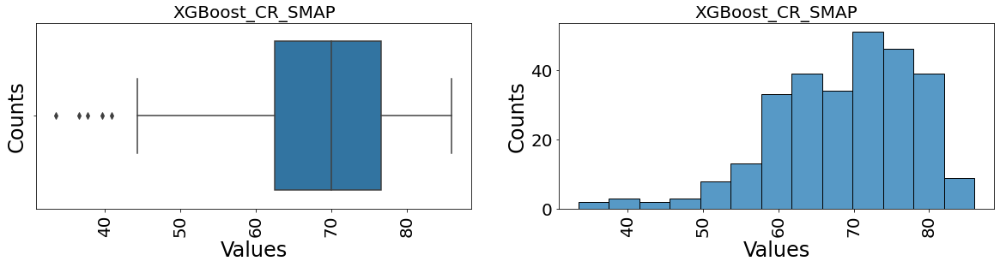

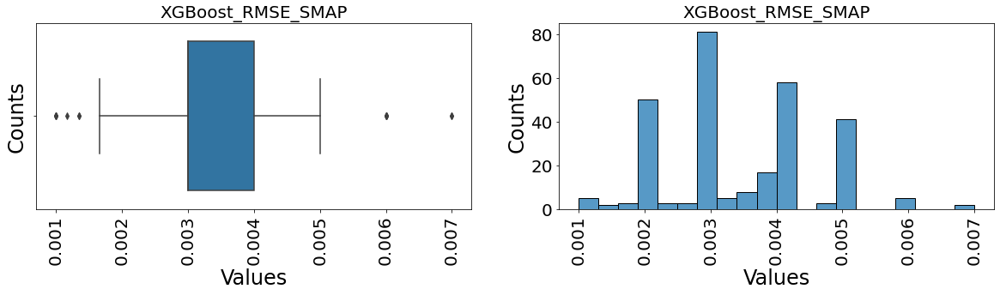

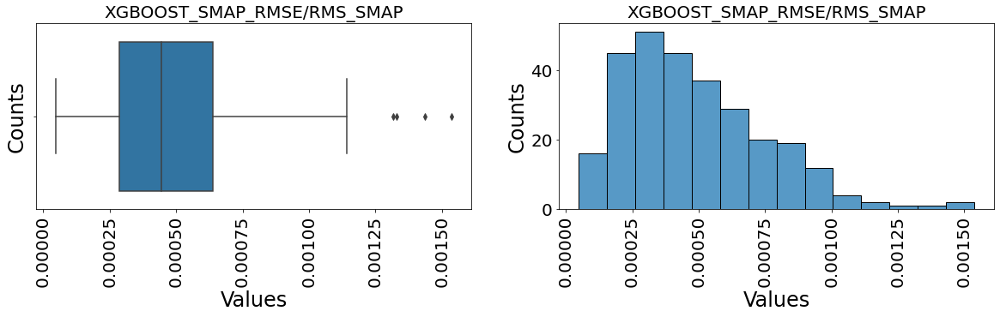

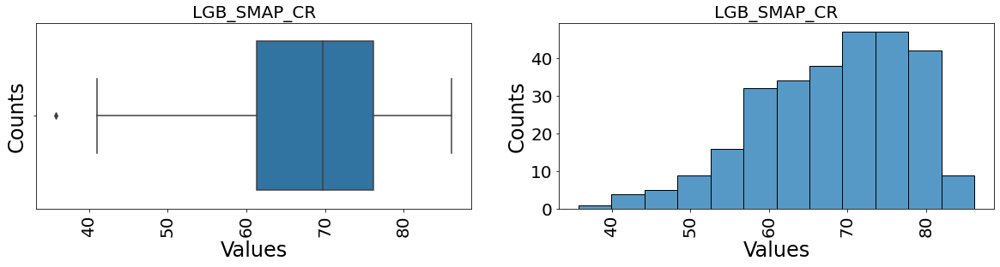

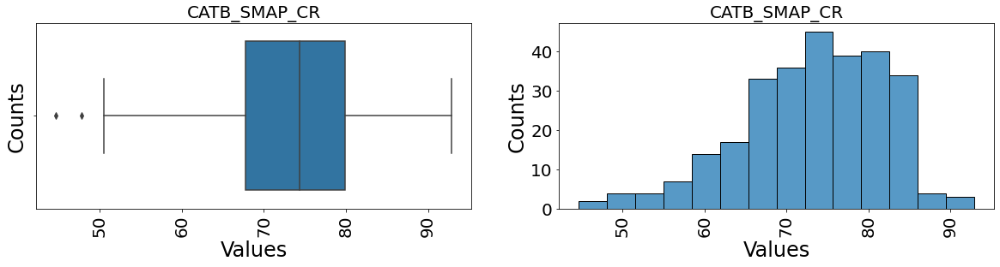

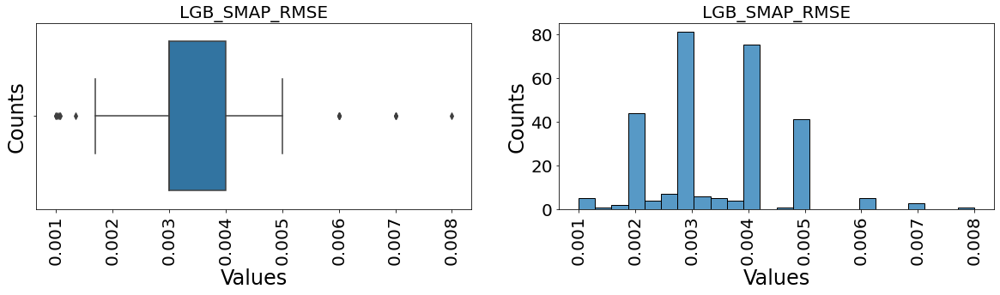

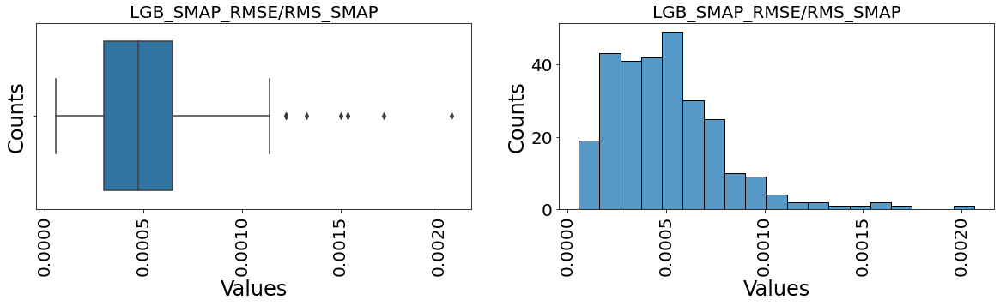

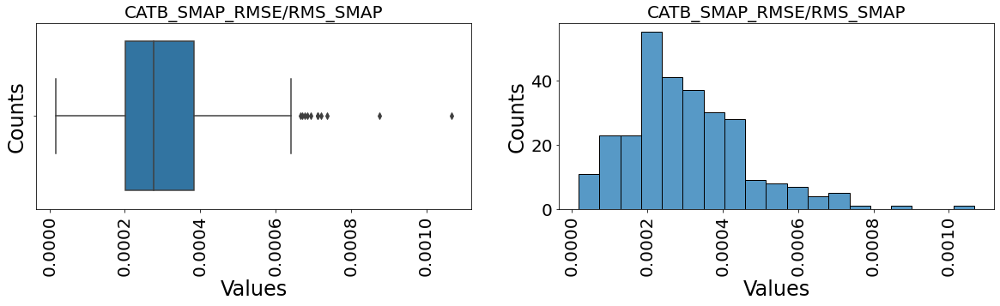

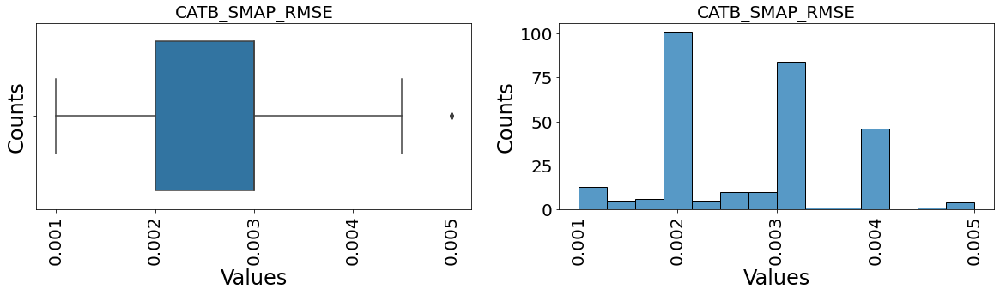

In [21]:
for K in Keys:
    plt.figure(figsize=(20,4))
    plt.subplot(1,2,1)
    sns.boxplot(DFf[f'{K}'])
    plt.xlabel(f'Values',fontsize=24)
    plt.ylabel('Counts',fontsize=24)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.tick_params(axis='x', which='major',rotation=90)
    plt.title(f'{K}',fontsize=20)
    
    plt.subplot(1,2,2)
    sns.histplot(DFf[f'{K}'])
    plt.xlabel(f'Values',fontsize=24)
    plt.ylabel('Counts',fontsize=24)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.tick_params(axis='x', which='major',rotation=90)
    plt.title(f'{K}',fontsize=20)

In [22]:
V1 = '''Correlation of LGBM predicted with 
SMAP Soil Moisture'''
V2 = '''R2 Score of LGBM and 
SMAP Soil Moisture'''

V3 = '''Correlation of CATB predicted with 
SMAP Soil Moisture'''
V4 = '''R2 Score of CATB and 
SMAP Soil Moisture'''

V5 = '''Correlation of XGB predicted with 
SMAP Soil Moisture'''
V6 = '''R2 Score of XGB and 
SMAP Soil Moisture'''

V7 = '''Combined Correlation of XGBoost, CATB and LGBM with
SMAP Soil Moisture'''

V11 = '''RMSE of LGBM predicted with
SMAP Soil Moisture'''
V22 = '''Relative Error of LGBM predicted
wrt SMAP Soil Moisture'''

V33 = '''RMSE of CATB predicted with
SMAP Soil Moisture'''
V44 = '''Relative Error of CATB predicted
wrt SMAP Soil Moisture'''

V55 = '''RMSE of XGB predicted with
SMAP Soil Moisture'''
V66 = '''Relative Error of XGB predicted
wrt SMAP Soil Moisture'''

In [23]:
keys11 = ['LGB_SMAP_CR','LGB_CD_SMAP','CATB_SMAP_CR','CATB_SMAP_CD','XGBoost_CR_SMAP','XGB_CD_SMAP','Combined_CR']
keys22 = ['LGB_SMAP_RMSE','LGB_SMAP_RMSE/RMS_SMAP','CATB_SMAP_RMSE',
          'CATB_SMAP_RMSE/RMS_SMAP','XGBoost_RMSE_SMAP','XGBOOST_SMAP_RMSE/RMS_SMAP']
keys1 = [f'{V1}',f'{V2}',f'{V3}',f'{V4}',f'{V5}',f'{V6}',f'{V7}']
keys2 = [f'{V11}',f'{V22}',f'{V33}',f'{V44}',f'{V55}',f'{V66}']

In [24]:
for j1,i1 in zip(keys11,keys1):
    DFf[f'{i1}'] = DFf[f'{j1}']
    
for j1,i1 in zip(keys22,keys2):
    DFf[f'{i1}'] = DFf[f'{j1}']

## Visualization of performance on Map

In [25]:
import geopandas as gpd
fp = r'indian_districts.shp'
map_df = gpd.read_file(fp) 
map_df_msk = map_df[((map_df['latitude']>21.5) & (map_df['latitude']<27.5)) & ((map_df['longitude']>72.5) & (map_df['longitude']<79.5))]
DF3 = map_df_msk
DF3 = DF3[DF3['state nam0']!='Uttar Pradesh']
DF3 = DF3[DF3['state nam0']!='Chhattisgarh']

fp1 = r'C:\Users\Ravi\Downloads\chambal\shp\chambal.shp'
DF31 = gpd.read_file(fp1) 

In [26]:
for CD,CR in zip(Listed,Listed2):
  DFf[f'{CD}'] = (((np.array(DFf[f'{CR}']))/100)**2)*100

In [27]:
for j1,i1 in zip(keys11,keys1):
    DFf[f'{i1}'] = DFf[f'{j1}']
    
for j1,i1 in zip(keys22,keys2):
    DFf[f'{i1}'] = DFf[f'{j1}']

In [28]:
#DFf.to_csv('WCM_Correlations_3Km.csv',index=False)

In [29]:
lat_K, lon_K = np.mgrid[22.18:27.6:0.36, 73.18:79.6:0.36]
m,n = lat_K.shape
m,n

(16, 18)

In [30]:
from shapely.geometry import Point
import xarray as xr

polygon        =   DF31.geometry[:]
lon, lat       =   np.asarray(lon_K), np.asarray(lat_K)
points         =   np.array([Point(x, y) for x, y in zip(lon.flatten(), lat.flatten())], dtype=object)
mask           =   np.array([polygon.contains(point) for point in points])
mask           =   mask.reshape(lon.shape)
temp_mask      =   xr.DataArray(mask, dims=['nlon', 'nlat']) 
temp_mask      =   (temp_mask.where(temp_mask)).fillna(0)
finalMask1     =   np.array(pd.DataFrame(temp_mask).replace(0,np.nan))
finalMask1     =   np.array(pd.DataFrame(finalMask1).replace(1,0))

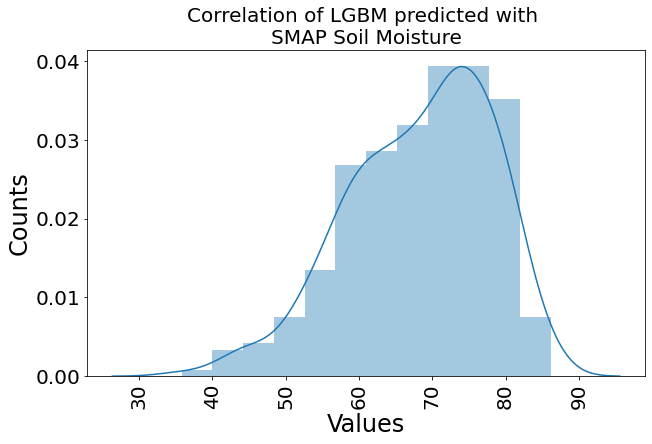

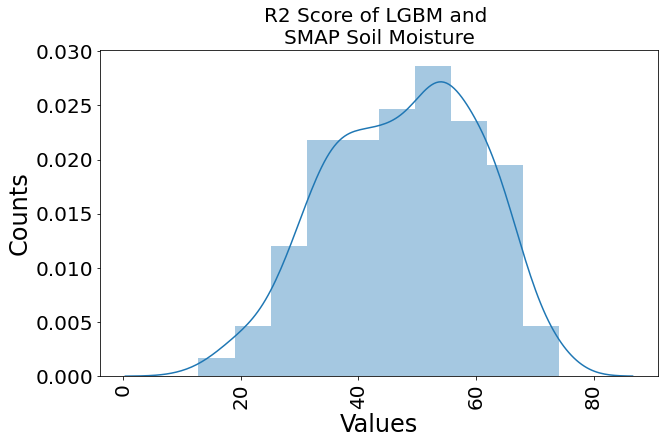

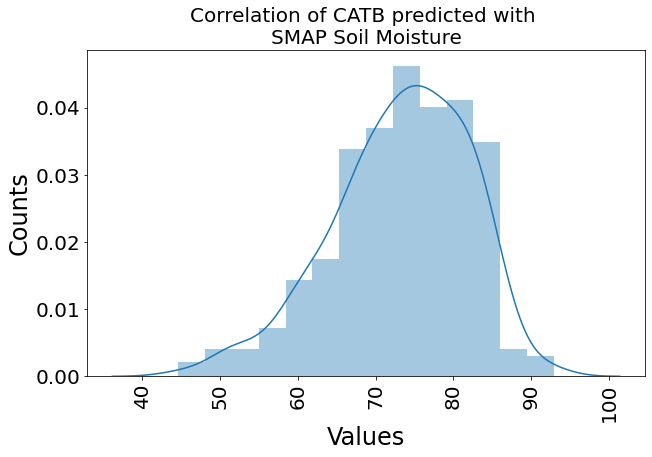

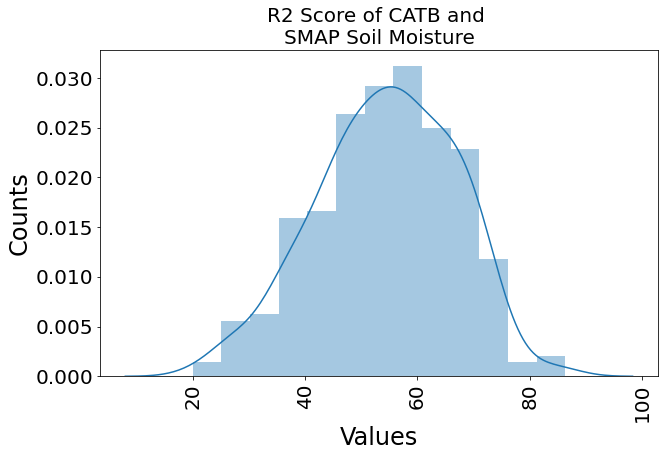

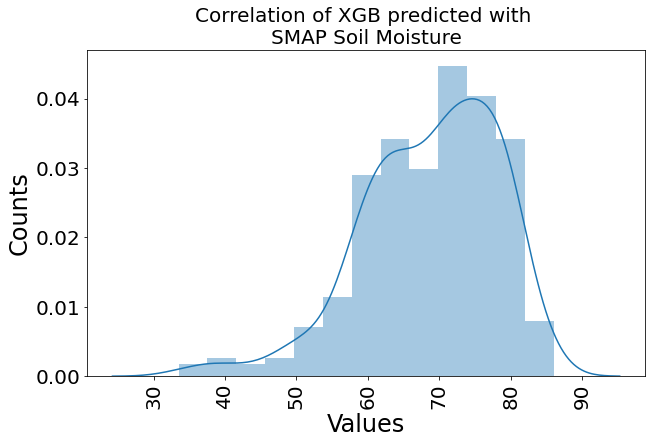

...

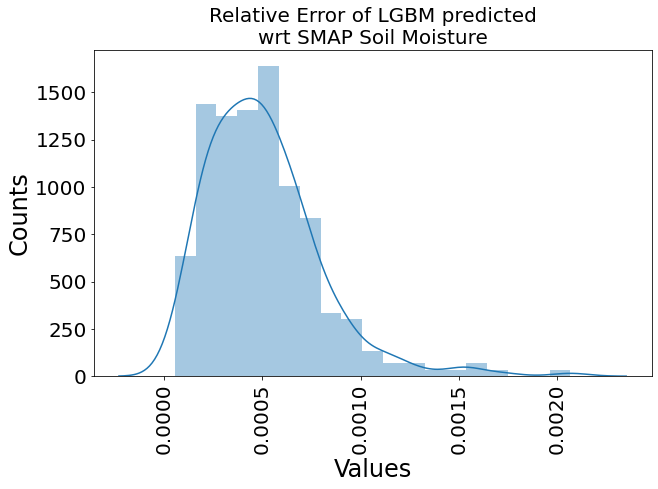

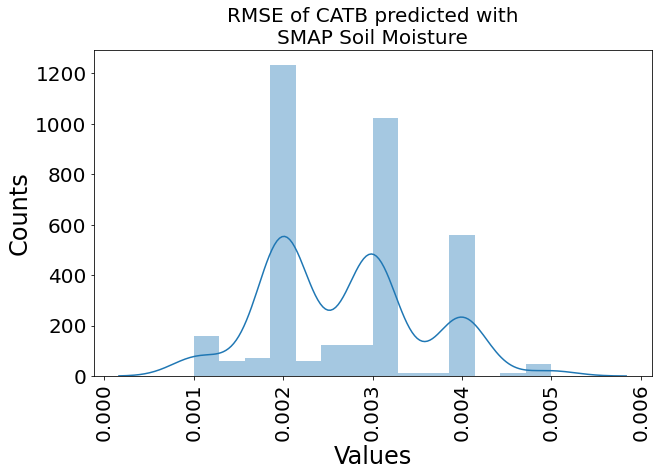

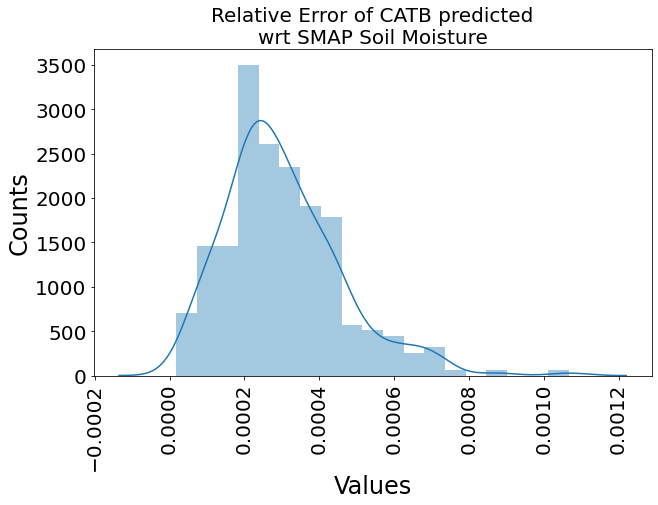

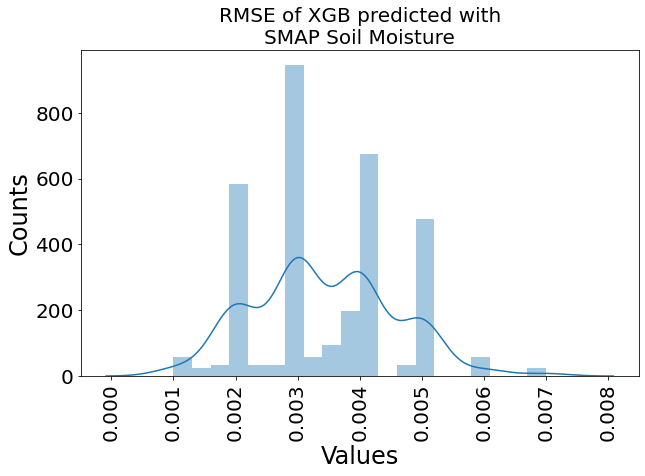

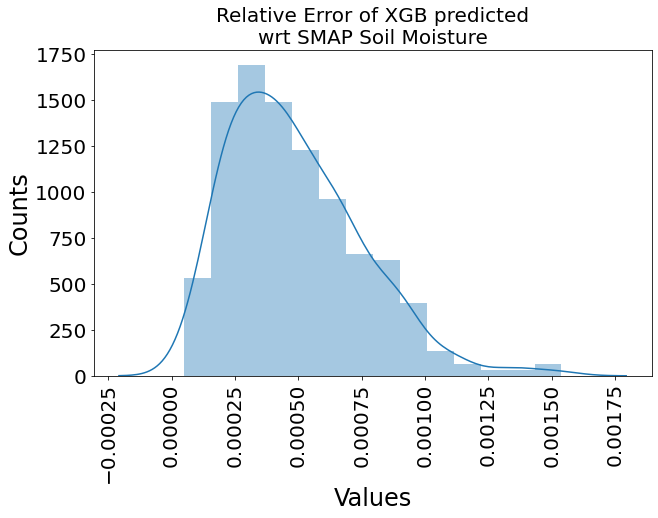

In [31]:
V = [V1,V2,V3,V4,V5,V6,V7,V11,V22,V33,V44,V55,V66]
for V in V:
    plt.figure(figsize=(10,6))
    sns.distplot(np.array(DFf[f'{V}']).flatten())
    plt.xlabel(f'Values',fontsize=24)
    plt.ylabel('Counts',fontsize=24)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.tick_params(axis='x', which='major',rotation=90)
    plt.title(f'{V}',fontsize=20)

In [32]:
S1 = ['Panch Mahals','Dungarpur','Dausa','Mandsaur','Bharuch','Chhindwara','Tikamgarh','Harda','Vadodara',
      'Damoh','Narsimhapur','Narmada','Nandurbar','Barwani','Dhar','Sirohi','Gandhinagar','Anand','Kheda',
      'Sabar Kantha','Bharatpur','Karauli','Bhind','Gwalior','Vidisha','Sagar','Raisen','Hoshangabad','Dohad',
      'Ratlam','Datia','Shajapur','Morena','Jhalawar','Dewas','East Nimar','West Nimar','Betul','Jodhpur',
      'Nagaur','Pali','Tonk','Sawai Madhopur','Shivpuri','Dhaulpur', 'Bhilwara','Bundi','Rajsamand','Neemuch',
      'Chittaurgarh','Baran','Sehore','Banswara','Jhabua','Rajgarh','Guna','Indore']

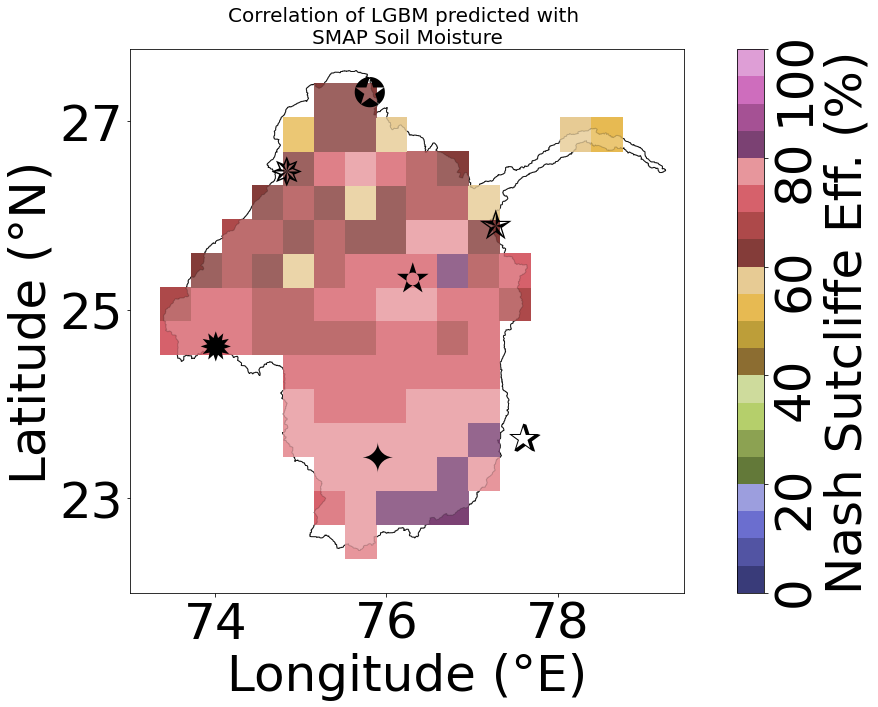

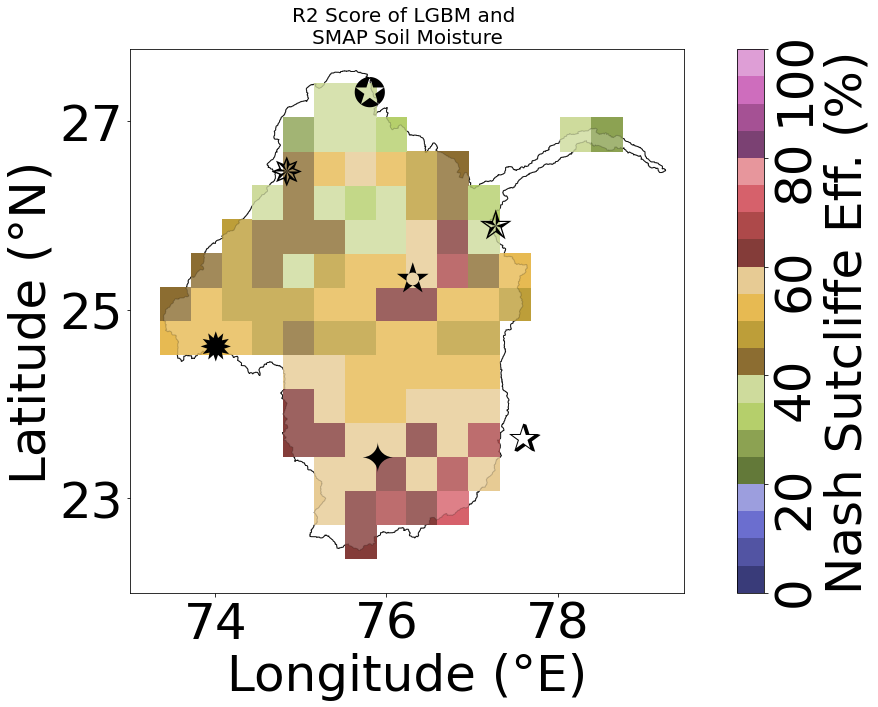

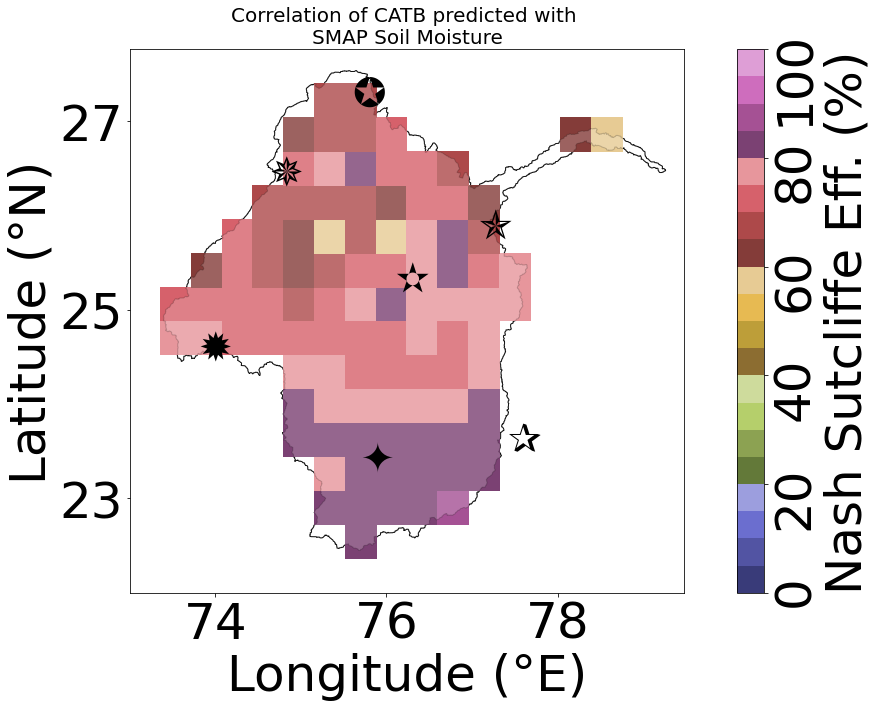

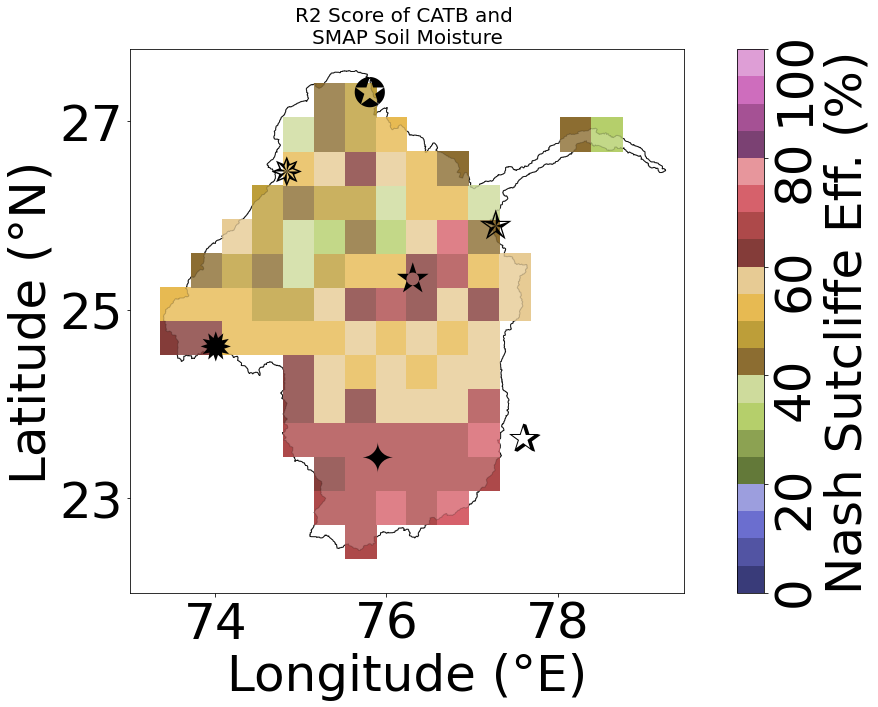

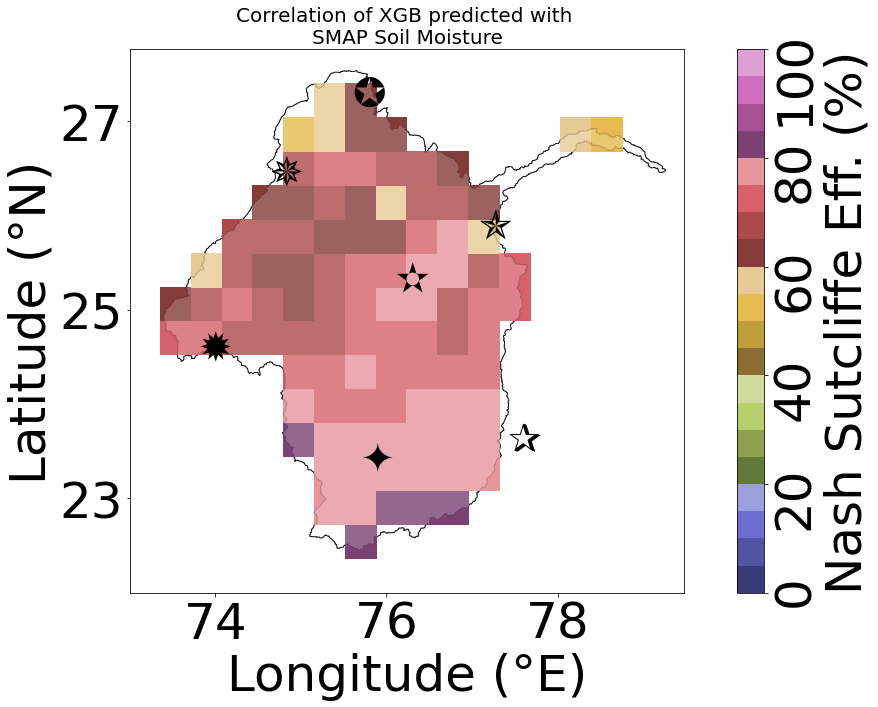

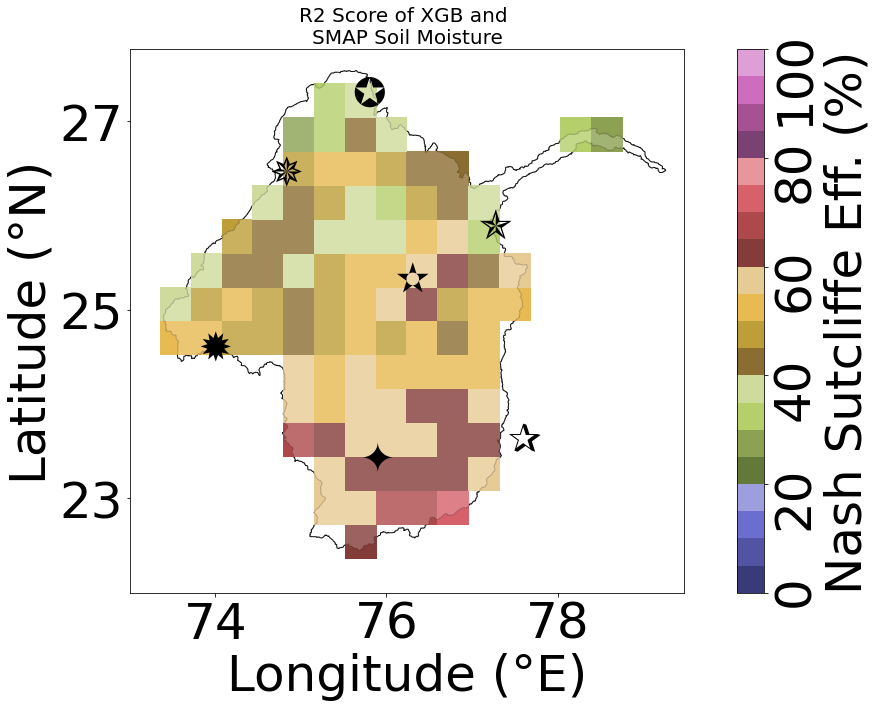

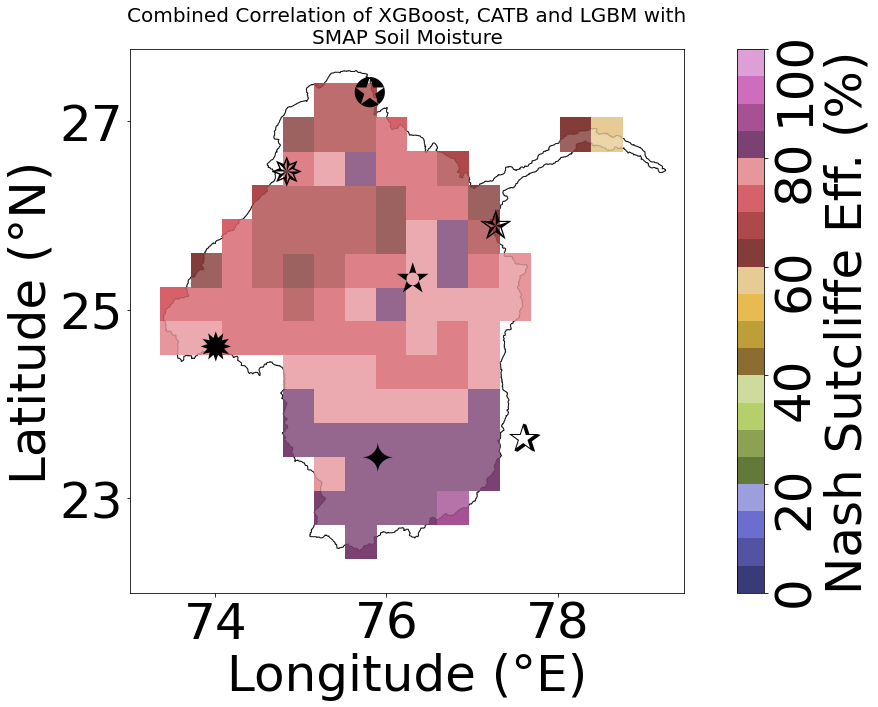

In [64]:
for K in keys1:
    K1 = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1
    fig , ax = plt.subplots(figsize=(19, 10))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_K, lat_K, K1,cmap="tab20b",vmin=0,vmax=94)
    DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.2)
    plt.xlabel('Longitude (°E)',fontsize=50)
    plt.ylabel('Latitude (°N)',fontsize=50)
    cbar = plt.colorbar()
    cbar.set_label(f'Nash Sutcliffe Eff. (%)',fontsize=50)
    cbar.ax.tick_params(rotation=90,labelsize=50)
    plt.tick_params(axis='both', which='major', labelsize=50)
    plt.clim(0, 100)
    plt.yticks(np.arange(23,29,2))
    plt.xticks(np.arange(74,79,2))
    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=40,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=40,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=40,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=40,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=40,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=40,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=40,alpha=1)
    plt.title(f'''{K}''',fontsize=20)

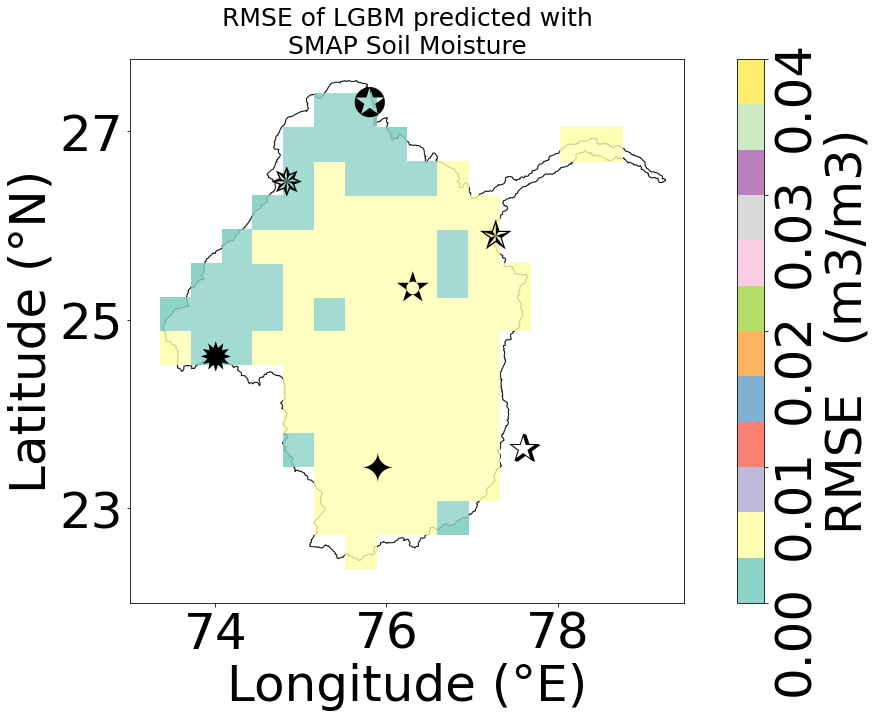

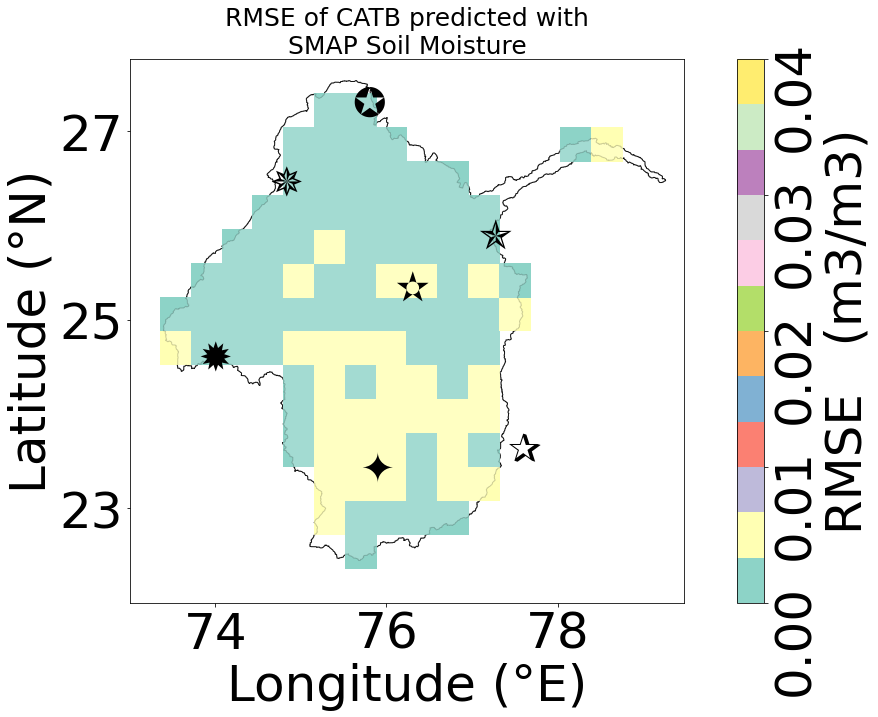

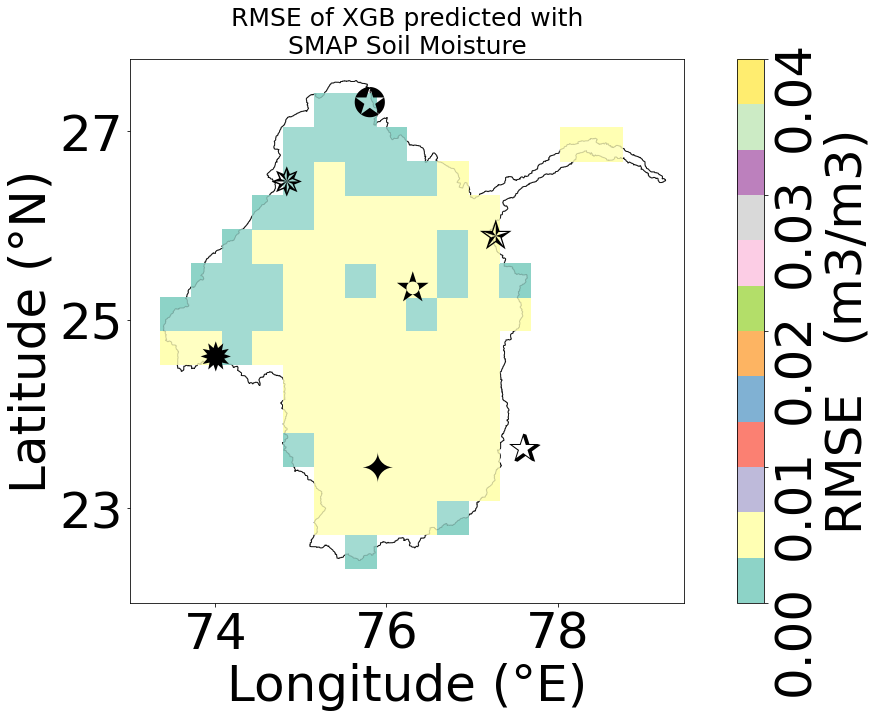

In [71]:
for i in range(len(keys2)):
    k  = i+2
    if i%2==0:  
        K  = keys2[i]
        K1 = np.array(DFf[f'{K}']).reshape(m,n)
        K1 = finalMask1+K1
        fig , ax = plt.subplots(figsize=(19,10))
        DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
        plt.pcolor(lon_K, lat_K, K1,cmap="Set3",vmin=0,vmax=0.25)
        DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.2)
        plt.xlabel('Longitude (°E)',fontsize=50)
        plt.ylabel('Latitude (°N)',fontsize=50)
        cbar = plt.colorbar()
        cbar.set_label(f'{K[:8].replace("of","")} (m3/m3)',fontsize=50)
        cbar.ax.tick_params(rotation=90,labelsize=50)
        plt.tick_params(axis='both', which='major', labelsize=50)
        plt.clim(0, 0.04)
        plt.yticks(np.arange(23,29,2))
        plt.xticks(np.arange(74,79,2))
        for i in range(len(DF3)):
          X = DF3['longitude'].iloc[i]
          Y = DF3['latitude'].iloc[i]
          S = DF3['district n'].iloc[i]
          S = S.replace("*","")
          S = S[9:]
          if S not in S1:
                if S=='Ajmer':
                    plt.text(X,Y,'✵',fontsize=40,alpha=1)
                if S=='Sheopur':
                    plt.text(X,Y,'✯',fontsize=40,alpha=1)
                if S=='Jaipur':
                    plt.text(X,Y,'✪',fontsize=40,alpha=1)
                if S=='Kota':
                    plt.text(X,Y,'✫',fontsize=40,alpha=1)
                if S=='Udaipur':
                    plt.text(X,Y,'✹',fontsize=40,alpha=1)
                if S=='Bhopal':
                    plt.text(X,Y,'✰',fontsize=40,alpha=1)
                if S=='Ujjain':
                    plt.text(X,Y,'✦',fontsize=40,alpha=1)
        plt.title(f'''{K}''',fontsize=25)

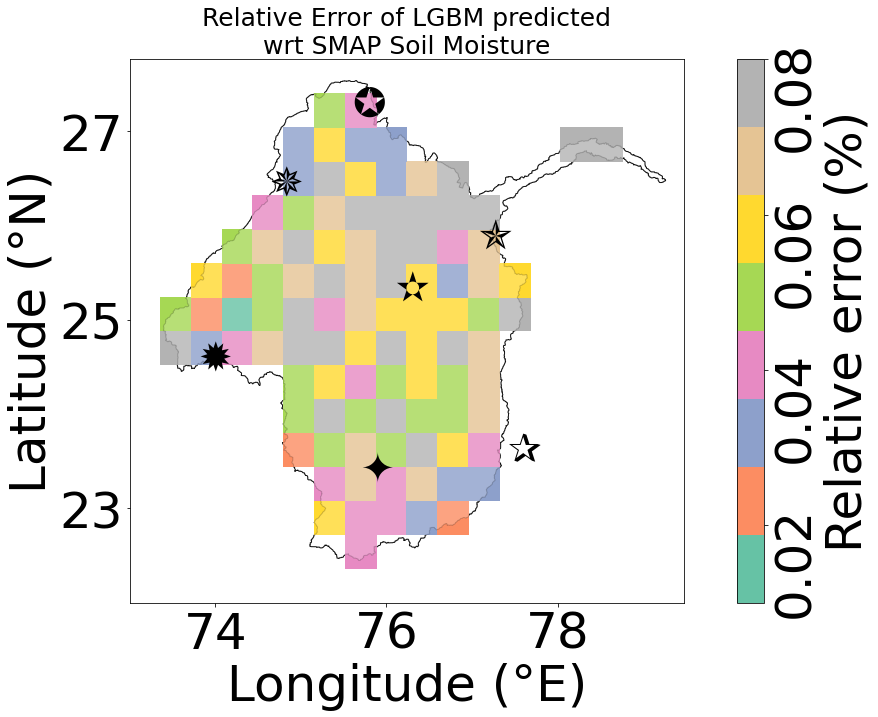

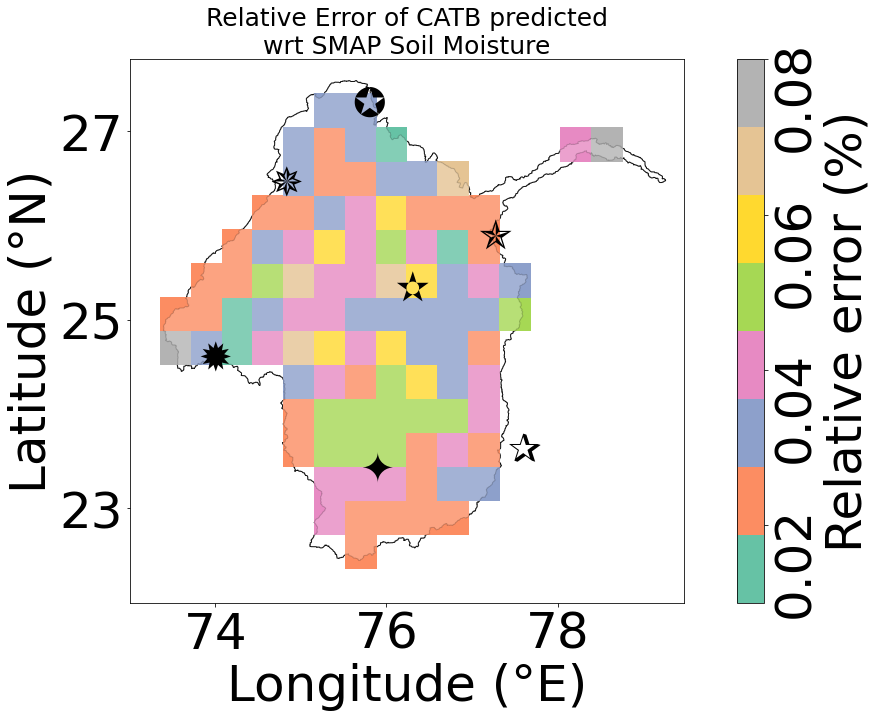

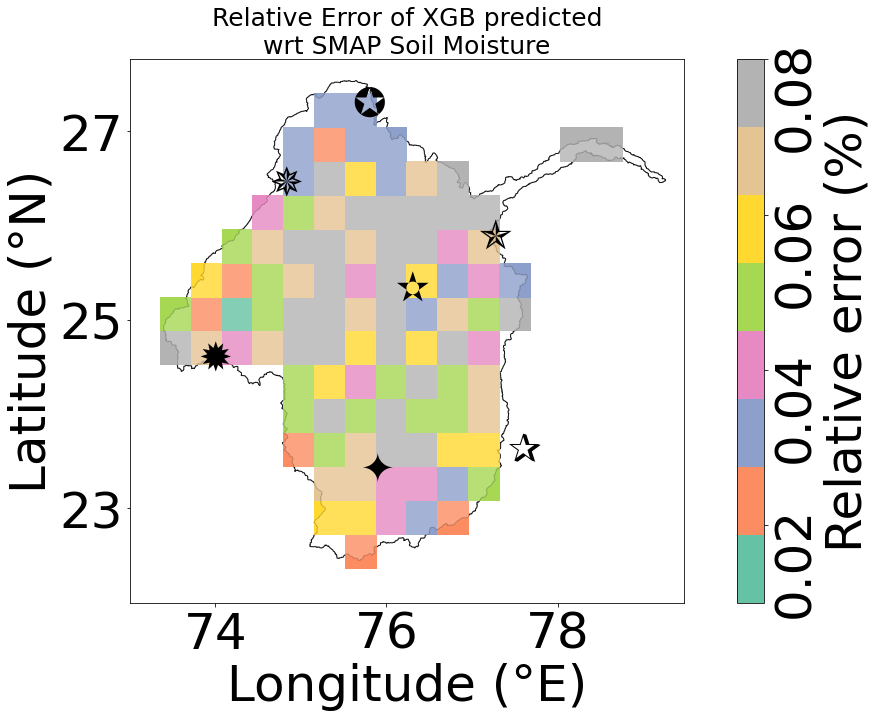

In [76]:
for i in range(len(keys2)):
    k  = i+2
    if i%2!=0:  
        K  = keys2[i]
        K1 = np.array(DFf[f'{K}']).reshape(m,n)
        K1 = finalMask1+K1
        fig , ax = plt.subplots(figsize=(19,10))
        DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
        plt.pcolor(lon_K, lat_K, K1*100,cmap="Set2",vmin=0,vmax=1)
        DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.2)
        plt.xlabel('Longitude (°E)',fontsize=50)
        plt.ylabel('Latitude (°N)',fontsize=50)
        cbar = plt.colorbar()
        cbar.set_label(f'{K[:8].replace("of","")} error (%)',fontsize=50)
        cbar.ax.tick_params(rotation=90,labelsize=50)
        plt.tick_params(axis='both', which='major', labelsize=50)
        plt.clim(0.01, 0.08)
        plt.yticks(np.arange(23,29,2))
        plt.xticks(np.arange(74,79,2))
        for i in range(len(DF3)):
          X = DF3['longitude'].iloc[i]
          Y = DF3['latitude'].iloc[i]
          S = DF3['district n'].iloc[i]
          S = S.replace("*","")
          S = S[9:]
          if S not in S1:
                if S=='Ajmer':
                    plt.text(X,Y,'✵',fontsize=40,alpha=1)
                if S=='Sheopur':
                    plt.text(X,Y,'✯',fontsize=40,alpha=1)
                if S=='Jaipur':
                    plt.text(X,Y,'✪',fontsize=40,alpha=1)
                if S=='Kota':
                    plt.text(X,Y,'✫',fontsize=40,alpha=1)
                if S=='Udaipur':
                    plt.text(X,Y,'✹',fontsize=40,alpha=1)
                if S=='Bhopal':
                    plt.text(X,Y,'✰',fontsize=40,alpha=1)
                if S=='Ujjain':
                    plt.text(X,Y,'✦',fontsize=40,alpha=1)
        plt.title(f'''{K}''',fontsize=25)

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">With Land Cover Type</p>

### With 100 m resolution LC 
### 36 Km grid cell contour plot

In [36]:
from tifffile import tifffile
from matplotlib.colors import LinearSegmentedColormap

tile3   = tifffile.imread('E060N40_PROBAV_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-map_EPSG-4326.tif')
Tile1   = np.array(tile3)
lat_LC,lon_LC = np.arange(20,40,0.0009921), np.arange(60,100,0.00099211)
lat_LC = lat_LC[2100:7656:5]
lon_LC = lon_LC[13300:19600:5]
Tile2  = Tile1[-7656:-2100:5,13300:19600:5]
lat3 = lat_LC[::-1]
lon3 = lon_LC
lon_,lat_ = np.meshgrid(lon3,lat3)

In [37]:
Listed_Cover = ['Shrubs','Herbaceous vegetation','vegetated cropland','Built up','Sparse vegetation',
                             'Permanent water bodies','Herbaceous wetland','Closed forest, evergreen needle leaf',
                             'Closed forest, evergreen, broad leaf','Closed forest, deciduous broad leaf',
                             'Closed forest, unknown','Open forest, evergreen needle leaf','Open forest, evergreen broad leaf',
                             'Open forest, deciduous broad leaf','Open forest, unknown']

### Creating Standard Colors for the Land Cover

In [38]:
colors = [(255,187,34),(255,255,76),(240,150,255),(250,0,0),(180,180,180),(0,50,200),(0,150,160),
          (88,72,31),(0,153,0),(0,204,0),(0,120,0),(102,96,0),(141,180,0),(160,220,0),(100,140,0)] 

color = []
for i in colors:
    c = []
    for j in i:
        c.append(j/255)
    c = tuple(c)
    color.append(c)
cmap_name = 'my_list'
cmap = LinearSegmentedColormap.from_list(cmap_name, color, N=15)
Tick = np.array([20,30,40,50,60,70,80,90,100,110,120,130,140,150,160])/255
Tick = Tick.tolist()

In [39]:
Font = '''Shrubs(5.639%)\n
Herbaceous vegetation(6.27 %)\n
vegetated cropland(76.29 %)\n
Built up(1.65 %)\n
Sparse vegetation(0.35 %)\n
Permanent water bodies(0.546 %)\n
Herbaceous wetland(0.51 %)\n
Closed Forest(3-5 %)\n
Open forest(5-6 %)'''

In [40]:
TDF1 = pd.DataFrame(Tile2)
Rep = [80,90,111,112,114,116,121,122,124,126]
New = [70,80,90,100,110,120,130,140,150,160]
for i,j in zip(Rep,New):
    TDF1 = TDF1.replace(i,j)

In [42]:
finalMask2  = np.array(pd.read_csv('LCV.csv')).reshape(lon_.shape)
TDF         = np.array(TDF1)+finalMask2

In [43]:
n1 = 8

<a id="1"></a>
# <p style="background-color:#682F2F;font-family:newtimeroman;color:#FFF9ED;font-size:150%;text-align:center;border-radius:10px 10px;">Resampled Land Cover with Maps</p> 

+ https://www.researchgate.net/post/Can-anyone-provide-a-shape-file-of-Indian-Districts/553a4a5ad4c11848798b45a4/citation/download. 

In [84]:
def Plotting5(K,n1,S1,Sz):
    K1 = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1
    fig , ax = plt.subplots(figsize=(20, 20))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_,lat_,TDF/255,cmap=cmap)
    DF31.plot(color = "white", edgecolor = 'black',axes=ax,alpha=0.1)
    cbar = plt.colorbar(ticks=Tick)
    cbar.ax.set_yticklabels(Listed_Cover,fontsize=Sz)
    cbar.set_label(f'Land Cover Type',fontsize=Sz)
    
    contours = plt.contour(lon_K,lat_K,K1,n1, vmin=0,vmax=95,colors='k',alpha=0.8)
    plt.clabel(contours, inline=True, fontsize=Sz,colors='black', fmt='%1.0f')
    plt.xlabel('Longitude (°E)',fontsize=Sz)
    plt.ylabel('Latitude (°N)',fontsize=Sz)
    plt.tick_params(axis='both', which='major', labelsize=Sz)
    plt.title(f'''{K} with {n1} Contour Level''',fontsize=Sz)

    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=50,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=50,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=50,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=50,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=50,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=50,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=50,alpha=1)
    
def Plotting6(K,n1,S1,Sz):
    K1 = np.array(DFf[f'{K}']).reshape(m,n)
    K1 = finalMask1+K1
    fig , ax = plt.subplots(figsize=(20, 20))
    DF31.plot(color = 'white',edgecolor = 'black',axes=ax)
    plt.pcolor(lon_,lat_,TDF/255,cmap=cmap,alpha=0.8)
    DF31.plot(color = 'white', edgecolor = 'black',axes=ax,alpha=0.1)
    cbar = plt.colorbar(ticks=Tick)
    cbar.ax.set_yticklabels(Listed_Cover,fontsize=Sz)
    cbar.set_label(f'Land Cover Type',fontsize=Sz)
    
    contours = plt.contour(lon_K,lat_K,K1*100,n1,vmin=np.min(K1),vmax=np.max(K1),colors='k',alpha=0.8)
    plt.clabel(contours, inline=True, fontsize=Sz,colors='black', fmt='%1.3f')
    plt.xlabel('Longitude (°E)',fontsize=Sz)
    plt.ylabel('Latitude (°N)',fontsize=Sz)
    plt.tick_params(axis='both', which='major', labelsize=Sz)
    plt.title(f'''{K} with {n1} Contour Level''',fontsize=Sz)
    for i in range(len(DF3)):
      X = DF3['longitude'].iloc[i]
      Y = DF3['latitude'].iloc[i]
      S = DF3['district n'].iloc[i]
      S = S.replace("*","")
      S = S[9:]
      if S not in S1:
            if S=='Ajmer':
                plt.text(X,Y,'✵',fontsize=50,alpha=1)
            if S=='Sheopur':
                plt.text(X,Y,'✯',fontsize=50,alpha=1)
            if S=='Jaipur':
                plt.text(X,Y,'✪',fontsize=50,alpha=1)
            if S=='Kota':
                plt.text(X,Y,'✫',fontsize=50,alpha=1)
            if S=='Udaipur':
                plt.text(X,Y,'✹',fontsize=50,alpha=1)
            if S=='Bhopal':
                plt.text(X,Y,'✰',fontsize=50,alpha=1)
            if S=='Ujjain':
                plt.text(X,Y,'✦',fontsize=50,alpha=1)

In [81]:
n1  = 8
Sz  = 35

Wall time: 36.4 s


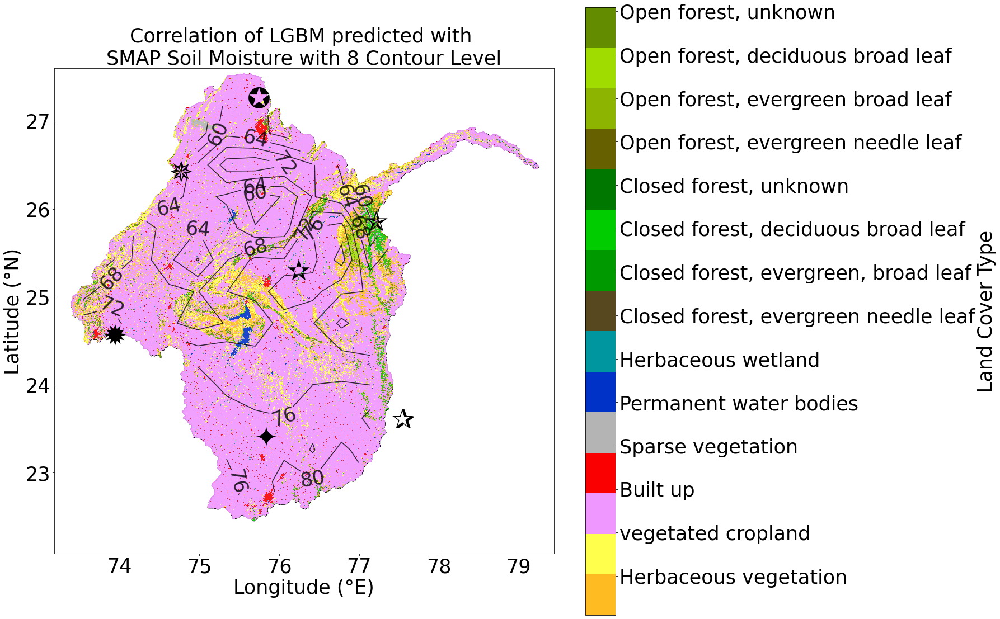

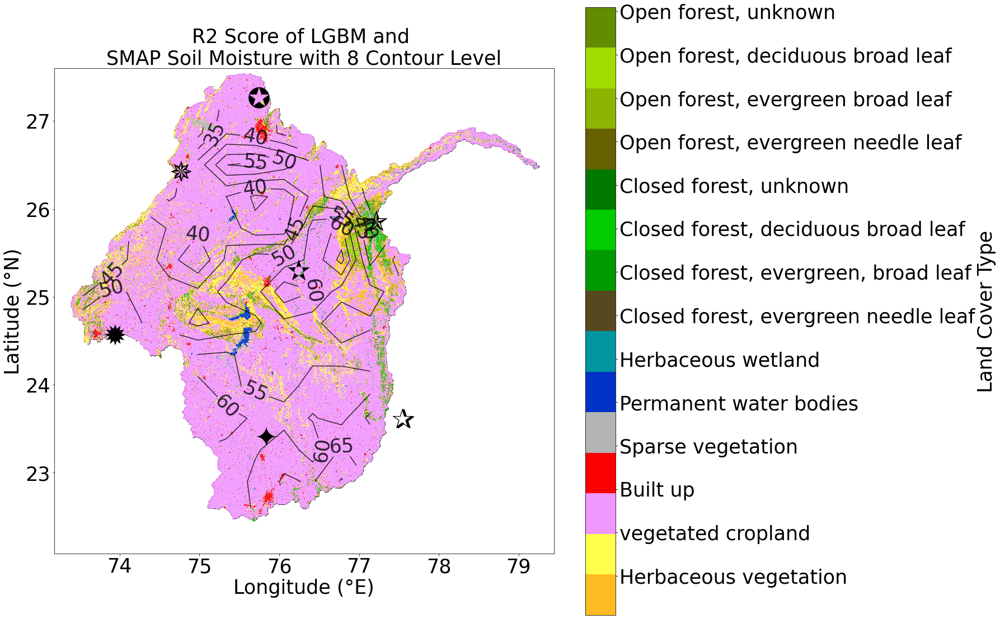

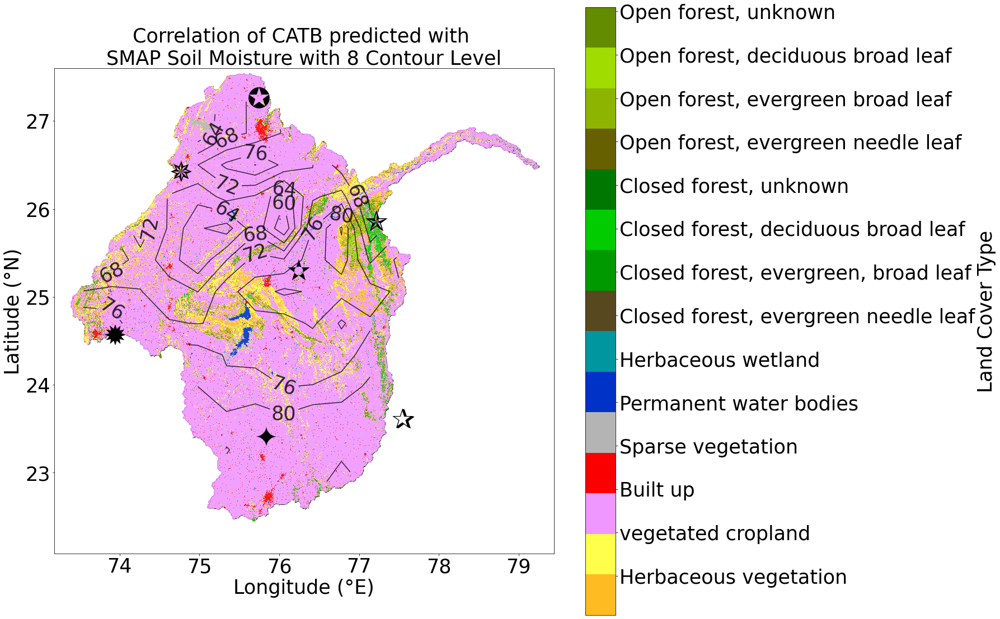

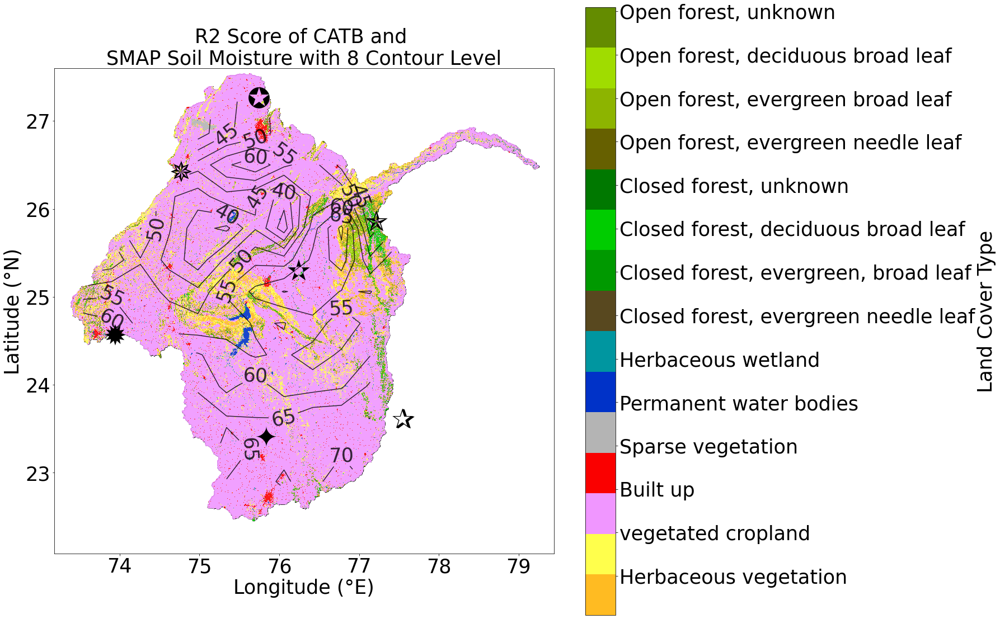

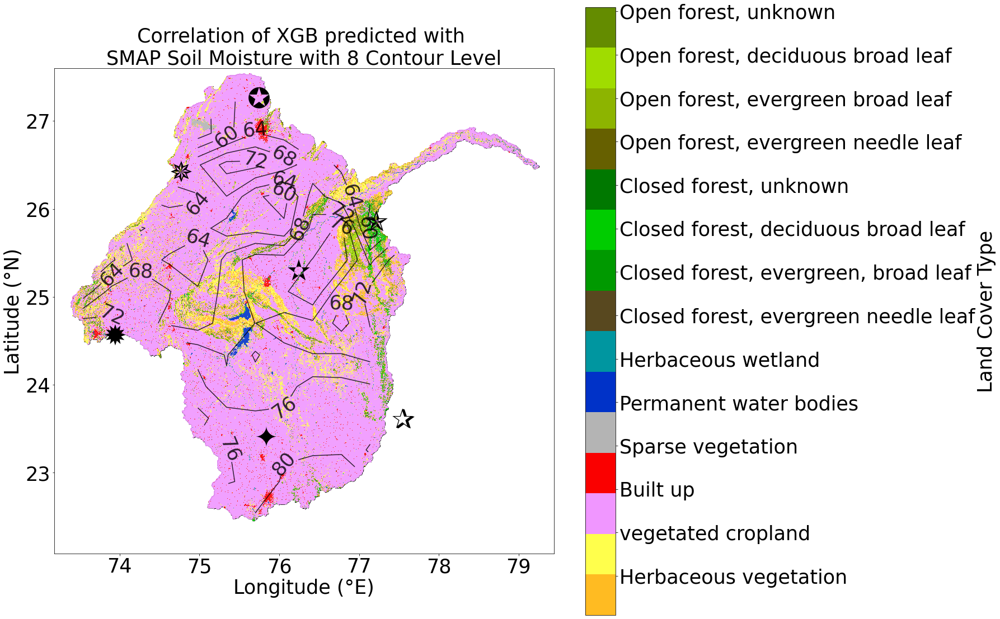

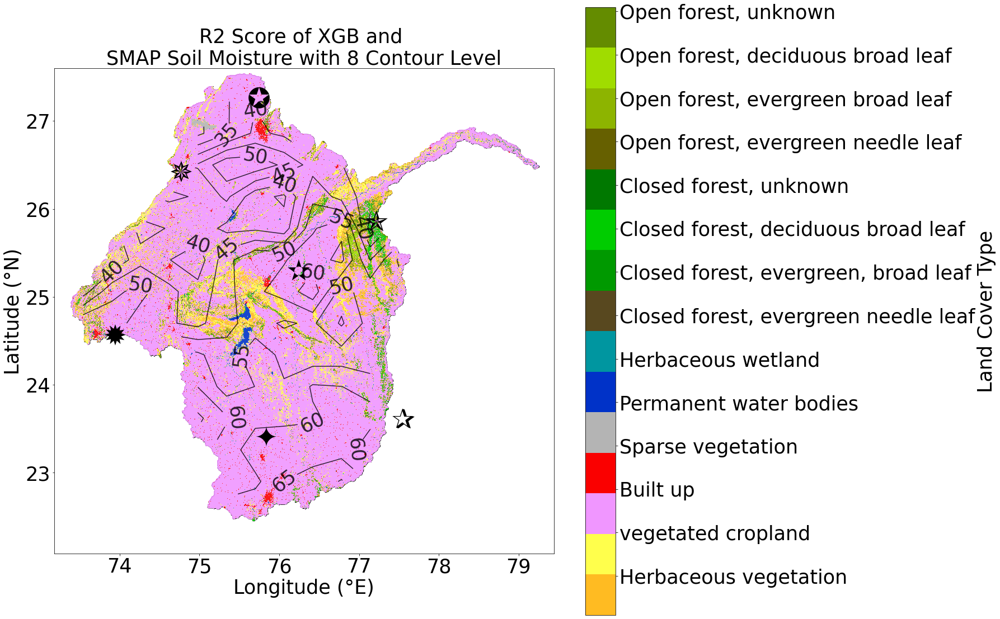

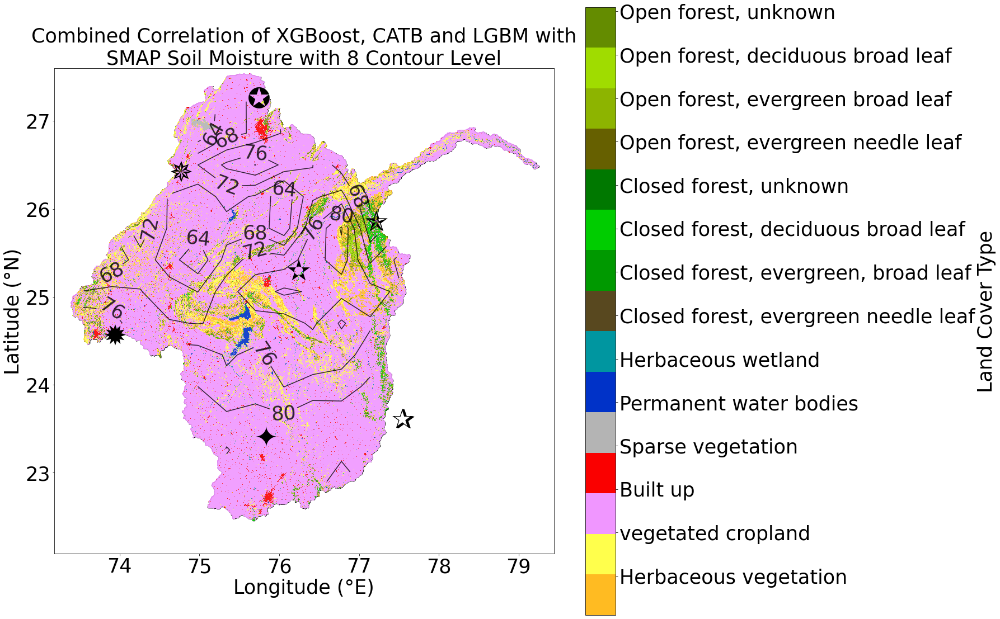

In [82]:
%%time
for i in range(len(keys1)):
  K = keys1[i]
  Plotting5(K,n1,S1,Sz)

Wall time: 30.5 s


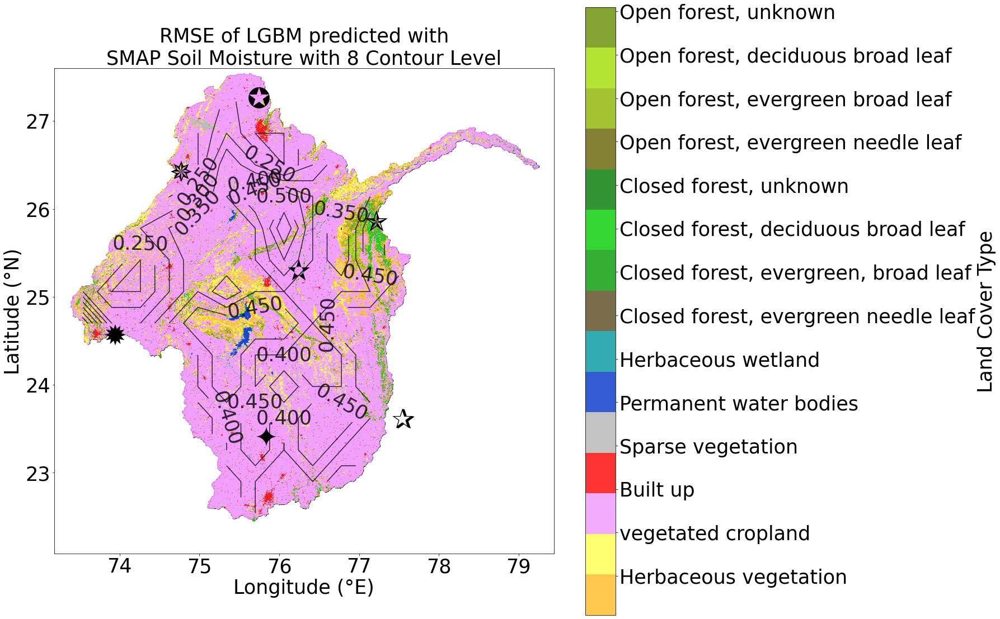

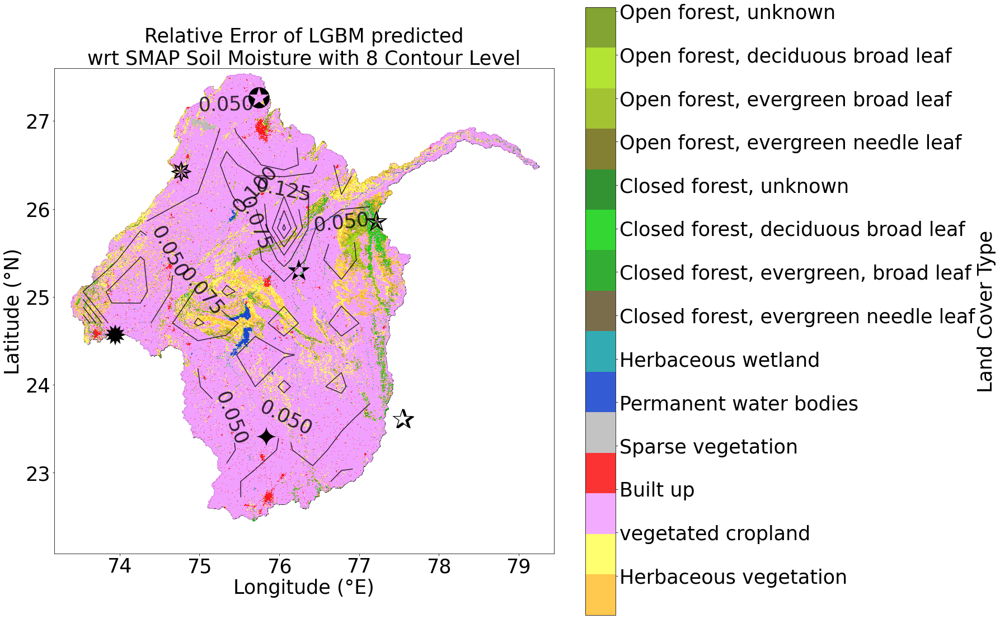

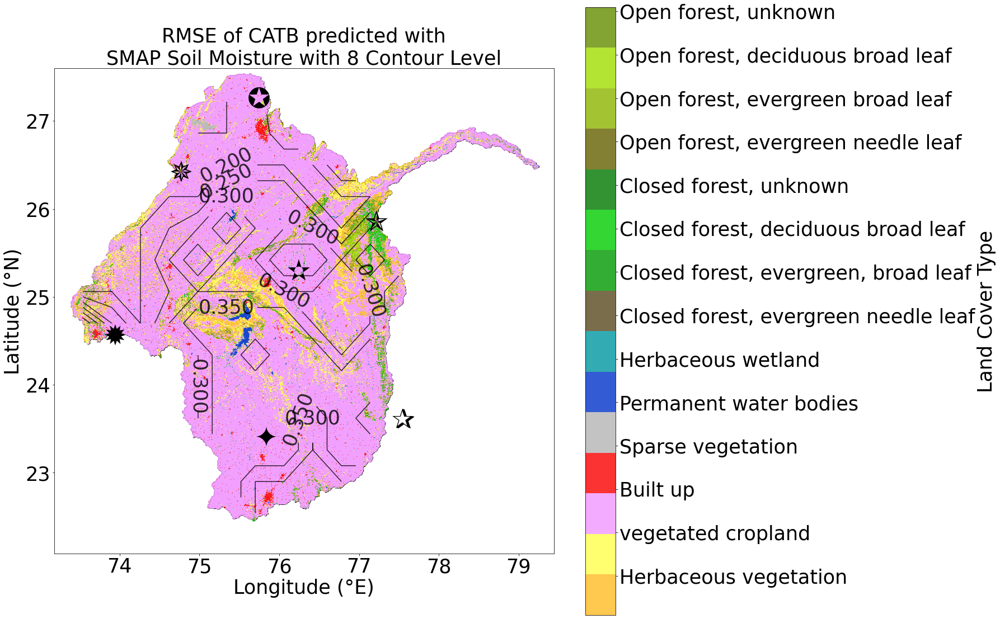

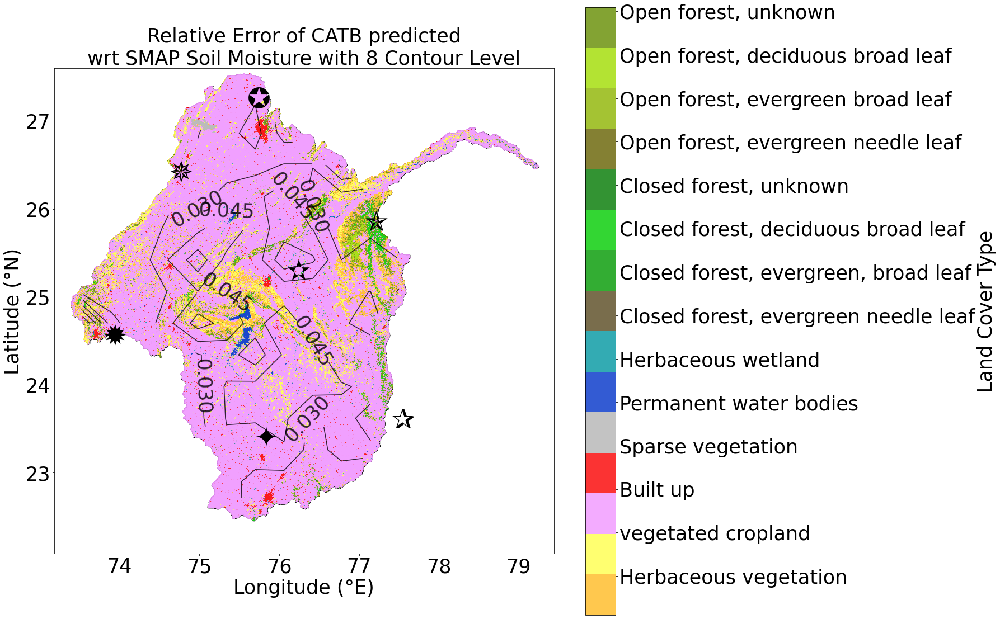

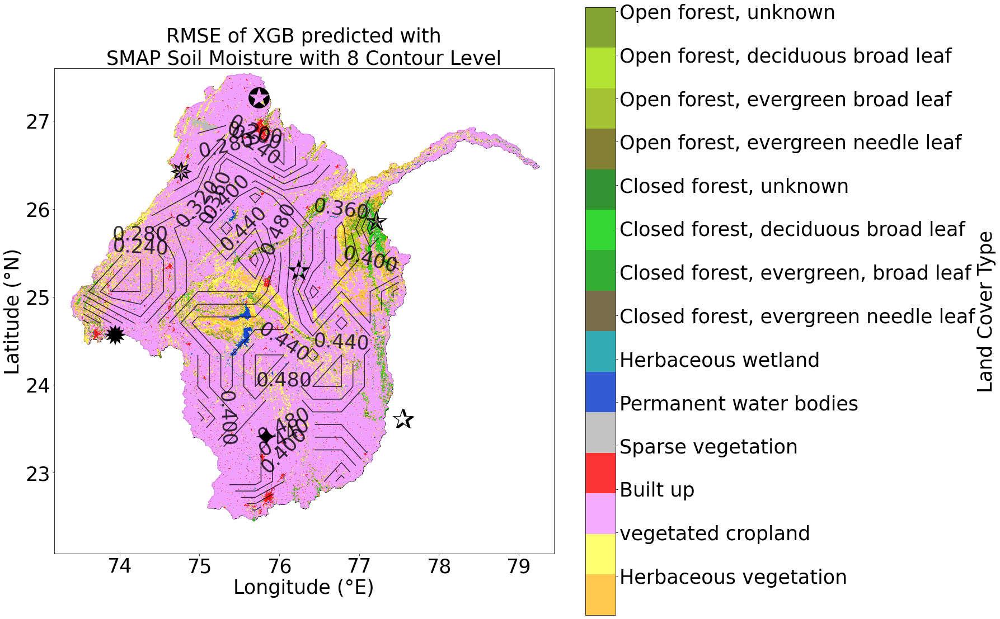

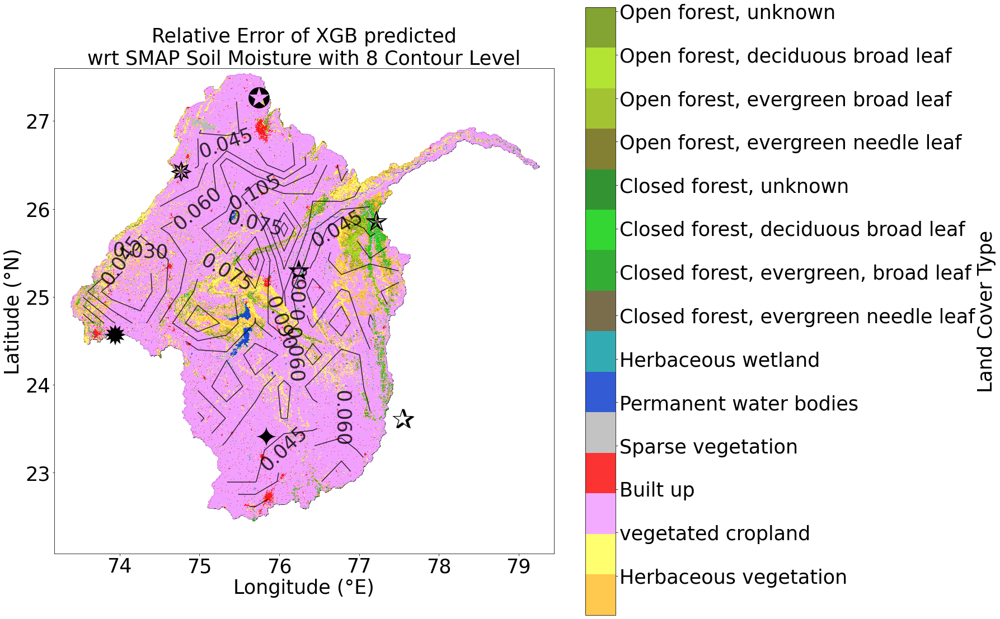

In [85]:
%%time
for i in range(len(keys2)):
  K = keys2[i]
  Plotting6(K,n1,S1,Sz)